# Predicción de ventas

Los datos entregados corresponden a ventas realizadas en una única tienda Jumbo en el período que comprende desde el 2021-01-02 hasta el 2022-01-09. El objetivo final de la evaluación es realizar una predicción diaria de las ventas de la semana del 17 al 23 de Enero del 2022, es decir, un valor para cada día de la semana y para cada producto (Notar el desfase de una semana entre los datos y el período deseado). Los resultados numéricos concretos de dicha predicción no son relevantes para la evaluación, si no más bien el desarrollo y su dominio que quedará reflejado en el trabajo.

El dataset está compuesto por:


column_name | name      | description
------------|-----------|-------------------------------------------------------
ds          | fecha     | En formato YYYY-MM-DD, corresponde a la fecha de la transacción.
item_id     | producto_id | Identificador del producto que se vendió.
y           | venta     | Cantidad vendida del producto. En caso de ser decimal, se vende a granel (por ejemplo, frutas).
hierarchy_2_code | rubro_id | Código correspondiente al rubro al que pertenece el producto.


In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# !pip install seaborn

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import datetime
import plotly.express as px
from matplotlib.patches import Patch

sns.set(style="whitegrid", rc={ "xtick.labelsize":10, "ytick.labelsize":10, "axes.labelsize":10, "axes.titlesize":10})
sns.color_palette("Set2", as_cmap=True)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [4]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

## Importamos el Dataset

Lo primero que vamos a realizar es importar el dataset, que en este caso está en formato CSV.

In [5]:
## Leemos los datos desde el archivo
# ventas = pd.read_csv('/content/drive/MyDrive/Ventas/datos_ventas_test1.csv',
#                            sep=',')
ventas = pd.read_csv('datos_ventas_test1.csv',
                           sep=',')
ventas.head()

,ds,hierarchy_2_code,item_id,y
0,2021-10-10,82,1088128,1.00
1,2021-06-12,20,1147321,1.00
2,2021-09-20,10,190535,10.01
3,2021-07-10,82,949665,1.00
4,2021-02-09,83,1085445,1.00


Antes de empezar con el análisis del dataset vamos a realizar una copia del mismo para poder trabajar sobre ella y no sobre el dataset original.

In [6]:
## Creamos una copia del dataset
df = ventas.copy()
df.shape

(508658, 4)

A continuación vamos a explorar el dataset para ver qué tipo de datos tenemos, cuántos valores nulos, etc.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 508658 entries, 0 to 508657
Data columns (total 4 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   ds                508658 non-null  object 
 1   hierarchy_2_code  508658 non-null  int64  
 2   item_id           508658 non-null  int64  
 3   y                 508658 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 15.5+ MB


Podemos observar que la primera columna 'ds' es de tipo object, por lo tanto, vamos a convertirla a tipo datetime. Además, las columnas 'hierarchy_2_code' y 'item_id' son de tipo object, en consecuencia, vamos a convertirlas a tipo category.

In [8]:
df['ds'] = pd.to_datetime(df['ds'])
df[['item_id', 'hierarchy_2_code']] = df[['item_id', 'hierarchy_2_code']].astype('object')

Ahora que tenemos el dataset con los tipos de datos correctos, vamos a observar si hay valores faltantes.

In [9]:
df.isnull().sum()

ds                  0
hierarchy_2_code    0
item_id             0
y                   0
dtype: int64

Si bien se observan que no hay datos faltantes todavía nos queda por chequear si existen items que no tienen toda la serie completa, es decir, que tienen días en los que no hay datos de las ventas. Esto nos permitirá analizar luego cuáles son los items con más días faltantes, que podremos asumir que son los que tienen menos ventas y en el día faltante las ventas fueron nulas. Esto lo realizaremos más adelante.

## Split Train y Test
Antes de realizar el análisis del dataset vamos a separar el dataset en dos, uno que contenga los datos de entrenamiento y otro que contenga los datos de testeo. Para esto vamos a tomar la última semana del dataset para testeo y el resto para entrenamiento. Esto lo hacemos porque no queremos que el modelo aprenda con los datos de testeo y queremos conservar el dataset de testeo lo más aislado posible. Como estamos trabajando con una serie de tiempo, no podemos tomar los datos de testeo de forma aleatoria, sino que tenemos que tomar los últimos datos.

In [10]:
# Cantidad de días en el dataset
print('Cantidad de días en el dataset: ', df.ds.nunique(), '- Fecha comienzo:', df.ds.min(), ', fecha final: ', df.ds.max())

Cantidad de días en el dataset:  371 - Fecha comienzo: 2021-01-02 00:00:00 , fecha final:  2022-01-09 00:00:00


In [11]:
# Calculamos la fecha máxima del dataset
fecha_fin = df.ds.max()

# Calculamos la fecha de inicio de la última semana
fecha_split_train = df.ds.max() - datetime.timedelta(days=6)

# Filtramos los datos para obtener los dos dataset
df_train = df[df['ds'] < fecha_split_train]
df_test = df[df['ds'] >= fecha_split_train]

In [12]:
# Cantidad de días en el dataset de train
print('Cantidad de días en el dataset de test: ', df_test.ds.nunique(), '- Fecha comienzo:', df_test.ds.min(), ', fecha final: ', df_test.ds.max())

Cantidad de días en el dataset de test:  7 - Fecha comienzo: 2022-01-03 00:00:00 , fecha final:  2022-01-09 00:00:00


In [52]:
# Guardamos el datast de test
df_test.to_csv('datos_ventas_validation.csv',
               index=False)

## Análisis del dataset de train

A continuación vamos a realizar el análisis del dataset, esto es fundamental para obtener información valiosa, identificar patrones y tendencias, descubrir insights y tomar decisiones fundamentadas. A través del análisis, se pueden comprender las características de los datos, detectar valores atípicos o errores y extraer conocimientos relevantes. También nos permite evaluar la calidad y la completitud de los datos, lo cual es crucial para garantizar la precisión y la confiabilidad de los modelos predictivos.

In [13]:
print('Cantidad de items en el dataset: ', df_train.item_id.nunique())

Cantidad de items en el dataset:  5998


In [14]:
print('Cantidad de rubros en el dataset: ', df_train.hierarchy_2_code.nunique())

Cantidad de rubros en el dataset:  23


Contamos con 23 rubros distintos y 6029 items distintos.

In [15]:
print( 'Fecha comienzo:', df_train.ds.min(), ', fecha final: ', df_train.ds.max())

Fecha comienzo: 2021-01-02 00:00:00 , fecha final:  2022-01-02 00:00:00


El dataset de train tiene un año entero de datos para analizar pero es probable que alguno de los items tengan fechas faltantes, en caso afiramtivos agregaremos esas fechas.

### Análisis de valores faltantes, series con días sin ventas.

In [16]:
# Cantidad de días con ventas por item
dias_por_item = df_train.groupby('item_id')['ds'].nunique()
dias_por_item

item_id
135         85
143         32
162        212
655         11
701        356
          ... 
1166955      1
1169258      2
1169259      2
1169260      3
1169303      1
Name: ds, Length: 5998, dtype: int64

Acá vemos por ejemplo que el item 1169260 tiene solo ventas en 3 días, vamos a visualizar los datos de ese item. Sin dudas la predicción en este tipo de items va a ser problematica.

In [17]:
df_train.loc[df_train.item_id==1169260]

,ds,hierarchy_2_code,item_id,y
76226,2021-12-29,1,1169260,3.04
109568,2021-12-31,1,1169260,1.96
390649,2021-12-30,1,1169260,0.96


In [18]:
## Buckets de cantidad de días con ventas
rangos = [0, 100, 150, 200, 250, 300, 367] 

# Cantidad de items por bucket de días con ventas
items_por_dias = pd.cut(dias_por_item, bins=rangos, right=False).value_counts().sort_index().reset_index()
items_por_dias.columns = ['Días con ventas', 'Cantidad de Items']

# Agregamos el porcentaje de cada cantidad de items
total_items = items_por_dias['Cantidad de Items'].sum()
items_por_dias['Porcentaje'] = ((items_por_dias['Cantidad de Items'] / total_items) * 100).map('{:.2f}%'.format)

items_por_dias

,Días con ventas,Cantidad de Items,Porcentaje
0,"[0, 100)",4184,69.76%
1,"[100, 150)",534,8.90%
2,"[150, 200)",383,6.39%
3,"[200, 250)",279,4.65%
4,"[250, 300)",193,3.22%
5,"[300, 367)",425,7.09%


En esta tabla podemos observar que el 70% de los items tienen más de 100 días faltantes lo cual parece mucho, veremos más adelante que implica esto a la hora de realizar las predicciones. Ahora vamos a completar las fechas faltantes en cada item para poder trabajar luego con el dataset completo.

In [19]:
# Obtenemos la fecha mínima y máxima del dataset
fecha_minima = df_train['ds'].min()
fecha_maxima = df_train['ds'].max()

# Creamos un rango de fechas completas utilizando range
rango_fechas_completas = pd.date_range(start=fecha_minima, end=fecha_maxima, freq='D')
df_fechas = pd.DataFrame({'ds': rango_fechas_completas})

In [20]:
# Obtenemos las combinaciones únicas de 'hierarchy_2_code' e 'item_id'
combinaciones_unicas = df_train[['hierarchy_2_code', 'item_id']].drop_duplicates()

# Combinación cruzada de las fechas
df_completo = pd.merge(df_fechas, combinaciones_unicas, how='cross')

df_train = df_completo.merge(df_train, on=['ds', 'item_id', 'hierarchy_2_code'], how='left')
df_train.head()

,ds,hierarchy_2_code,item_id,y
0,2021-01-02,82,1088128,NaN
1,2021-01-02,20,1147321,NaN
2,2021-01-02,10,190535,8.43
3,2021-01-02,82,949665,3.00
4,2021-01-02,83,1085445,NaN


In [21]:
# Nuevo dataset con las fechas completas
df_train.loc[df_train.item_id==1169260].sort_values(by='ds')

,ds,hierarchy_2_code,item_id,y
5043,2021-01-02,1,1169260,NaN
11041,2021-01-03,1,1169260,NaN
17039,2021-01-04,1,1169260,NaN
23037,2021-01-05,1,1169260,NaN
29035,2021-01-06,1,1169260,NaN
...,...,...,...,...
2170321,2021-12-29,1,1169260,3.04
2176319,2021-12-30,1,1169260,0.96
2182317,2021-12-31,1,1169260,1.96
2188315,2022-01-01,1,1169260,NaN


Chequeamos contra el dataset original, cabe aclarar que del 01/02 en adelante están en el dataset de test. Vemos que la serie para este item_id se completó con todos los días faltantes y se conservaron los que tenían información.

In [22]:
# Chequeamos contra el dataset original
df.loc[df.item_id==1169260].sort_values(by='ds')

,ds,hierarchy_2_code,item_id,y
76226,2021-12-29,1,1169260,3.04
390649,2021-12-30,1,1169260,0.96
109568,2021-12-31,1,1169260,1.96
74774,2022-01-03,1,1169260,0.83
148381,2022-01-06,1,1169260,1.97
29841,2022-01-07,1,1169260,2.05


Ahora proseguiremos a realizar el análisis del dataset, de los items, los rubros y la cantidad de ventas.


### Cantidad de items y ventas por rubro



In [23]:
# Agrupamos por rubro para calcular el total de items en cada uno de ellos
total_item_by_hier = df_train.groupby('hierarchy_2_code')['item_id'].nunique().to_frame().sort_values(by='hierarchy_2_code')
total_item_by_hier.rename(columns={'item_id': 'total_items'}, inplace=True)
total_item_by_hier.reset_index(inplace=True)
total_item_by_hier.head()

,hierarchy_2_code,total_items
0,1,164
1,2,65
2,10,36
3,15,446
4,20,324


In [24]:
# Agrupamos por rubro para calcular el total de ventas en cada uno de ellos
total_sales_by_hier = df_train.groupby('hierarchy_2_code')['y'].sum().to_frame().sort_values(by='hierarchy_2_code')
total_sales_by_hier.rename(columns={'y': 'total_sales'}, inplace=True)
total_sales_by_hier.reset_index(inplace=True)
total_sales_by_hier.head()

,hierarchy_2_code,total_sales
0,1,164964.04
1,2,49010.28
2,10,24226.62
3,15,1338252.69
4,20,43283.00


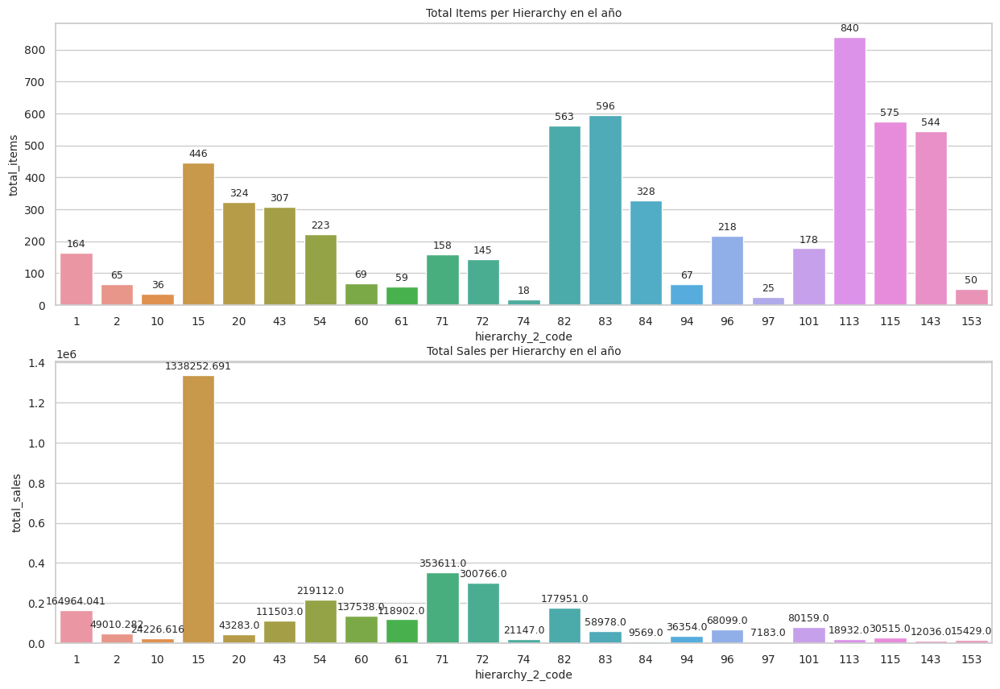

In [25]:
# Graficamos las ventas y la cantidad de items
fig, axes = plt.subplots(2,1, figsize=(15, 10))

sns.barplot(data=total_item_by_hier, x="hierarchy_2_code", y="total_items", ax=axes[0])
axes[0].bar_label(axes[0].containers[0], labels=total_item_by_hier.total_items, padding=3, fontsize=9)
axes[0].set_title('Total Items per Hierarchy en el año')

sns.barplot(data=total_sales_by_hier, x="hierarchy_2_code", y="total_sales", ax=axes[1])
axes[1].bar_label(axes[1].containers[0], labels=total_sales_by_hier.total_sales, padding=3, fontsize=9)
axes[1].set_title('Total Sales per Hierarchy en el año')


plt.show()

De estos dos gráficos podemos observar que la categoría 113 es la que tiene mayor cantidad de items sinembargo no es la que tiene más cantidad de ventas. La categoría 15 es la que tiene más ventas, pero la cantidad de items está dentro de la media. El resto de las categorías tiene más o menos la misma cantidad de ventas, esta es la que se detaca del resto por lo que podríamos investigar si no hay algún outlier.

### Total de ventas por mes por rubro

Es importante analizar el total de ventas por mes y por categoría para comprender el comportamiento de cada rubro a lo largo del tiempo. Inicialmente, realizaremos este análisis a nivel mensual para facilitar la visualización y, si es necesario, profundizaremos en él. Para lograrlo, crearemos dos nuevas columnas en el dataset: una indicando el mes y otra indicando el día. Estas columnas serán utilizadas para agrupar los datos y obtener los totales de ventas por mes y por categoría. Este enfoque nos permitirá obtener una visión detallada del rendimiento de cada rubro en diferentes momentos del año y realizar comparaciones significativas.

In [26]:
# Agregamos las columnas mes, día y día de la semana
df_train['mes'] = df_train['ds'].dt.month
df_train['dia'] = df_train['ds'].dt.day
df_train['dia_semana_abrev'] = df_train['ds'].dt.strftime('%a')
df_train.head()

,ds,hierarchy_2_code,item_id,y,mes,dia,dia_semana_abrev
0,2021-01-02,82,1088128,NaN,1,2,Sat
1,2021-01-02,20,1147321,NaN,1,2,Sat
2,2021-01-02,10,190535,8.43,1,2,Sat
3,2021-01-02,82,949665,3.00,1,2,Sat
4,2021-01-02,83,1085445,NaN,1,2,Sat


In [27]:
# Agrupamos por mes y rubro para calcular el total de ventas en cada uno de ellos
total_sales_by_hier_month = df_train.groupby(['hierarchy_2_code', 
                                              'mes'])['y'].sum().to_frame().sort_values(by='hierarchy_2_code')
total_sales_by_hier_month.rename(columns={'y': 'total_sales'}, inplace=True)
total_sales_by_hier_month.reset_index(inplace=True)
total_sales_by_hier_month.head()

,hierarchy_2_code,mes,total_sales
0,1,1,15381.25
1,1,12,13990.28
2,1,11,13293.04
3,1,10,13903.56
4,1,8,13421.66


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: 
The palette list has fewer values (10) than needed (23) and will cycle, which may produce an uninterpretable plot.
  # Remove the CWD from sys.path while we load stuff.


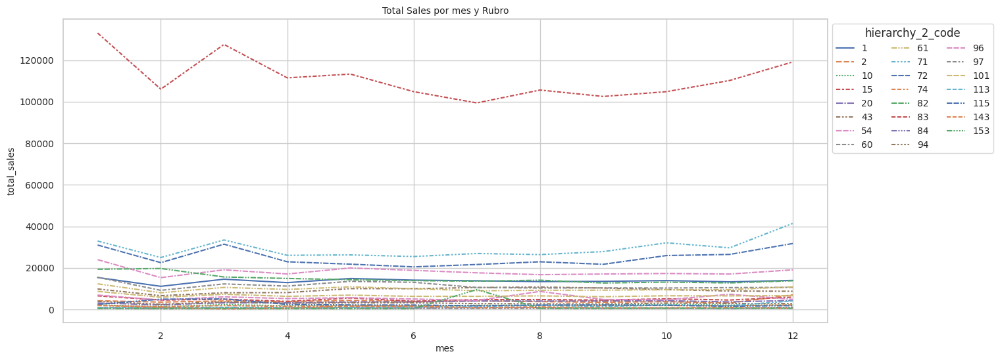

In [28]:
# Gráfico de cantidad de ventas por mes y rubro
colors = sns.color_palette()
fig, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(
    data=total_sales_by_hier_month,
    x="mes", 
    y="total_sales",
    hue="hierarchy_2_code", 
    style="hierarchy_2_code",
    palette=colors, ax=ax
)
ax.set_title('Total Sales por mes y Rubro')
sns.move_legend(ax, 
                "upper left", 
                bbox_to_anchor=(1, 1), 
                ncol=3, 
                prop={'size': 10})


En el gráfico se aprecia que el item 15 se destaca del resto debido a su alta cantidad de ventas, y esta tendencia se mantiene constante a lo largo de todos los meses. Esto sugiere que se trata de un rubro con un alto volumen de ventas de forma consistente. A simple vista, no se observa ninguna anomalía en los datos considerando la agrupación mensual. Sin embargo, para tener una visión más detallada, procederemos a generar un nuevo gráfico desagregando los datos por día, lo cual nos permitirá examinar la evolución diaria de las ventas. Con esto, podremos identificar cualquier patrón o comportamiento adicional que pueda surgir en el análisis.

### Total de ventas por día y Rubro

In [29]:
def ventas_por_dia(df, group_colum, col_wrap):
    # Agrupamos por rubro para ver la evolución diaria de las ventas de cada uno
    total_sales_by_hier_ds = df.groupby([group_colum, 'ds']
                                       )['y'].sum().to_frame().sort_values(by=group_colum)
    total_sales_by_hier_ds.rename(columns={'y': 'total_sales'}, inplace=True)
    total_sales_by_hier_ds.reset_index(inplace=True)
    total_sales_by_hier_ds.head()
       
    # Graficamos por mes y día
    sns.set(font_scale=2) 
    g = sns.FacetGrid(total_sales_by_hier_ds, 
                      hue=group_colum, 
                      col=group_colum, 
                      col_wrap=col_wrap,
                      sharey=False,
                      height=5, 
                      aspect=3)
    g.map_dataframe(sns.lineplot, x="ds", y="total_sales")
    
    plt.show()
    return total_sales_by_hier_ds 
    

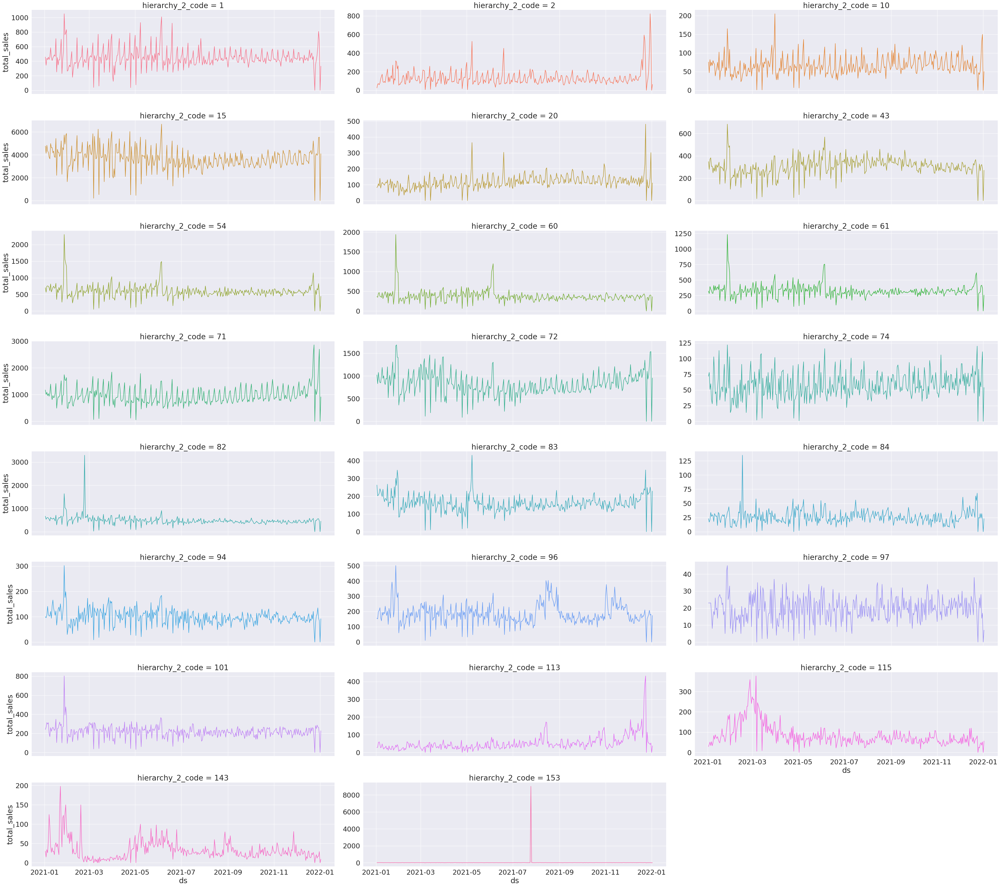

In [30]:
ventas_por_rubro = ventas_por_dia(df_train, 
                                  'hierarchy_2_code', 
                                  3)

Al analizar las gráficas, se observa claramente la presencia de valores atípicos en la mayoría de los rubros, especialmente en el rubro 153, donde se identifica un pico significativo cerca del mes de agosto. En contraste, en el rubro 115 parece haber un aumento cerca de marzo, seguido de un descenso posterior. En este punto, es necesario tomar una decisión sobre cómo abordar los valores atípicos, considerando la posibilidad de imputarles algún valor. Sin embargo, esta decisión será discutida más adelante.

Ahora, para continuar con el análisis, se investigará en mayor profundidad lo que está ocurriendo en el rubro 153, con el objetivo de determinar si este comportamiento es consistente en todos los items de dicho rubro o si se trata de un caso aislado. Mediante este análisis detallado, obtendremos información clave para comprender mejor las particularidades y posibles causas de las fluctuaciones en las ventas de ese rubro en particular.

### Total de ventas por día para un Rubro

A modo de ejemplo, procederemos a analizar las ventas de cada uno de los items que conforman el rubro 153. El proceso seguirá una metodología similar a la que empleamos anteriormente. Si deseáramos examinar otro rubro, bastaría con modificar el valor de 'rubro_seleccionado'. Es importante destacar que hemos limitado la cantidad de items mostrados en el gráfico por razones computacionales. De esta manera, podremos examinar de manera más detallada el comportamiento de las ventas para cada item en el rubro 153, permitiéndonos obtener información valiosa sobre posibles tendencias o patrones específicos en dicho rubro.

In [31]:
# Seleccionamos el rubro
rubro_seleccionado = 153
# rubro_seleccionado = 82

# Creamos el dataset de ese rubro
df_rubro = df_train.loc[df_train.hierarchy_2_code==rubro_seleccionado]
df_rubro.nunique()

ds                  366
hierarchy_2_code      1
item_id              50
y                    17
mes                  12
dia                  31
dia_semana_abrev      7
dtype: int64

Como este rubro tiene muchos items vamos a analizar los primeros 10 items a modo de ejemplo.

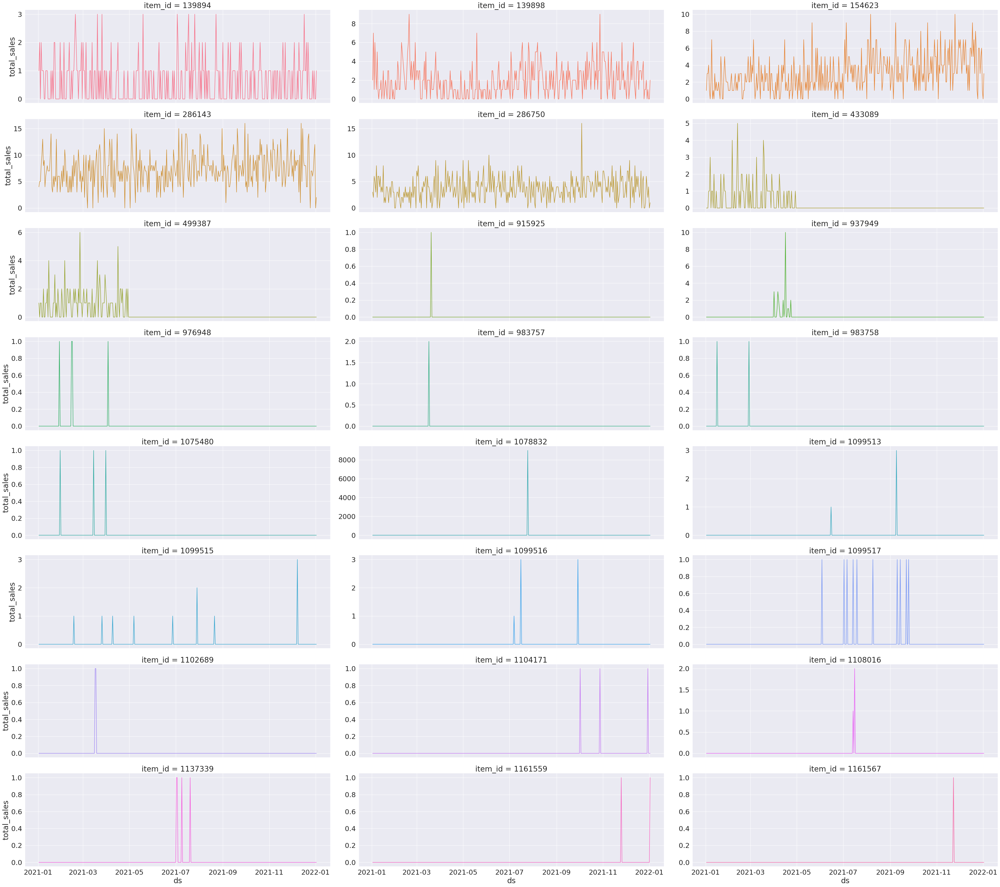

In [32]:
# Seleccionamos los primeros 24 items
items = df_rubro.item_id.unique()
item_select = items[0:24]

# Utilizamos la función para agrupar y graficar las ventas diarias
ventas_rubro = ventas_por_dia(df_rubro.loc[df_rubro.item_id.isin(item_select)], 
                              'item_id', 
                              3)

In [33]:
# # Seleccionamos los próximos 24 items
# items = df_rubro.item_id.unique()[24:48]

# # Utilizamos la función para agrupar y graficar las ventas diarias
# ventas_rubro = ventas_por_dia(df_rubro.loc[df_rubro.item_id.isin(items)], 'item_id', 3)

A través de estas gráficas, se puede observar que el rubro 153 presenta particularidades notables. Con excepción de los primeros cinco items, el resto muestra ventas esporádicas o algunos de ellos solían tener ventas al comienzo del año y luego dejaron de venderse. En estos casos, será necesario evaluar qué acciones tomar. Es relevante destacar que el item_id 1078832 es el responsable del pico significativo que se observaba en la gráfica del total por rubro. Sin embargo, también se identifican otros items que muestran un comportamiento similar. Estos hallazgos resaltan la importancia de investigar a fondo cada item en el rubro 153 para comprender las causas detrás de estas variaciones en las ventas y tomar decisiones informadas en consecuencia.

In [34]:
ventas_rubro.loc[ventas_rubro.total_sales==ventas_rubro.total_sales.max()]

,item_id,ds,total_sales
4823,1078832,2021-07-25,9000.00


## Análisis de Outliers y series a excluir

Para realizar una predicción precisa de las ventas, es importante tener en cuenta los siguientes aspectos:

* Datos insuficientes: Si se cuenta con series que tienen una muestra demasiado pequeña, es recomendable excluir esas series, ya que resulta difícil obtener predicciones confiables con una cantidad limitada de datos.
* Ventas discontinuas: Si una serie muestra ventas intermitentes o no sigue un patrón claro, puede resultar complicado realizar una predicción precisa. Los productos con ventas ocasionales y dispersas no permiten una estimación confiable de las ventas futuras.
* Datos atípicos extremos: Si una serie contiene valores atípicos o extremos que no reflejan el comportamiento típico de las ventas, estos datos pueden distorsionar los pronósticos. Antes de realizar la predicción, es recomendable excluir o tratar adecuadamente estos valores atípicos.
Al considerar estos factores y tomar decisiones informadas sobre qué series incluir o excluir, así como cómo tratar los valores atípicos, se podrá mejorar la precisión y confiabilidad de las predicciones de ventas.

### Series incompletas

Para mejorar la calidad de los datos y enfocarnos en series más consistentes, vamos a excluir aquellas que hayan tenido ventas en menos del 50% de los días durante los últimos 4 meses. Esta ventana de tiempo se selecciona considerando la posibilidad de que haya productos que hayan comenzado a venderse recientemente. Sin embargo, es importante tener en cuenta que esta exclusión se basa en un criterio personal y que podría ser necesario realizar un análisis más detallado para comprender el motivo detrás de ese comportamiento y tomar decisiones más precisas sobre qué hacer con esas series.

In [35]:
# Período seleccionado
meses_filtro = 6
porcentaje_filtro = .5

# Fecha más reciente
fecha_mas_reciente = df_train['ds'].max()

# Fecha 6 meses atrás
fecha_mas_antigua = fecha_mas_reciente - pd.DateOffset(months=meses_filtro)

# Filtramos los datos para analizar los últimos meses
df_filt = df_train[df_train['ds'] >= fecha_mas_antigua]

# Calculamos el número de días en el período seleccionado
num_dias_periodo = (fecha_mas_reciente - fecha_mas_antigua).days + 1

# Calculamos el número de días por venta
ventas_por_item = df_filt.groupby('item_id')['y'].count()

# Excluimos los items que tiene ventas en menos del 50% de los días
item_ids_a_excluir = ventas_por_item[ventas_por_item < (num_dias_periodo * porcentaje_filtro)].index
df_final = df_train[~df_train['item_id'].isin(item_ids_a_excluir)]

In [36]:
df_train.nunique()

ds                    366
hierarchy_2_code       23
item_id              5998
y                   21822
mes                    12
dia                    31
dia_semana_abrev        7
dtype: int64

In [37]:
df_final.nunique()

ds                    366
hierarchy_2_code       22
item_id              1041
y                   20149
mes                    12
dia                    31
dia_semana_abrev        7
dtype: int64

Al aplicar esta exclusión, se pierden un total de 4930 items y dos rubros, lo cual nos plantea la necesidad de analizar con mayor detalle qué hacer con ellos. Es importante determinar si es apropiado excluirlos o si, de hecho, tienen ventas aunque no cumplan con el criterio establecido. Para tomar una decisión informada, sería necesario contar con información adicional. Además, es importante tener en cuenta que este criterio de exclusión puede resultar en la presencia de series que solo tienen datos en los últimos meses. Esto podría tener implicaciones al realizar las predicciones, por lo que se debe tener en consideración.

Con el fin de proporcionar una representación visual de las ventas por rubro e item_id utilizando este nuevo conjunto de datos, procederemos a generar los gráficos correspondientes, lo cual nos permitirá obtener una mejor comprensión de las características y patrones presentes en los datos seleccionados.

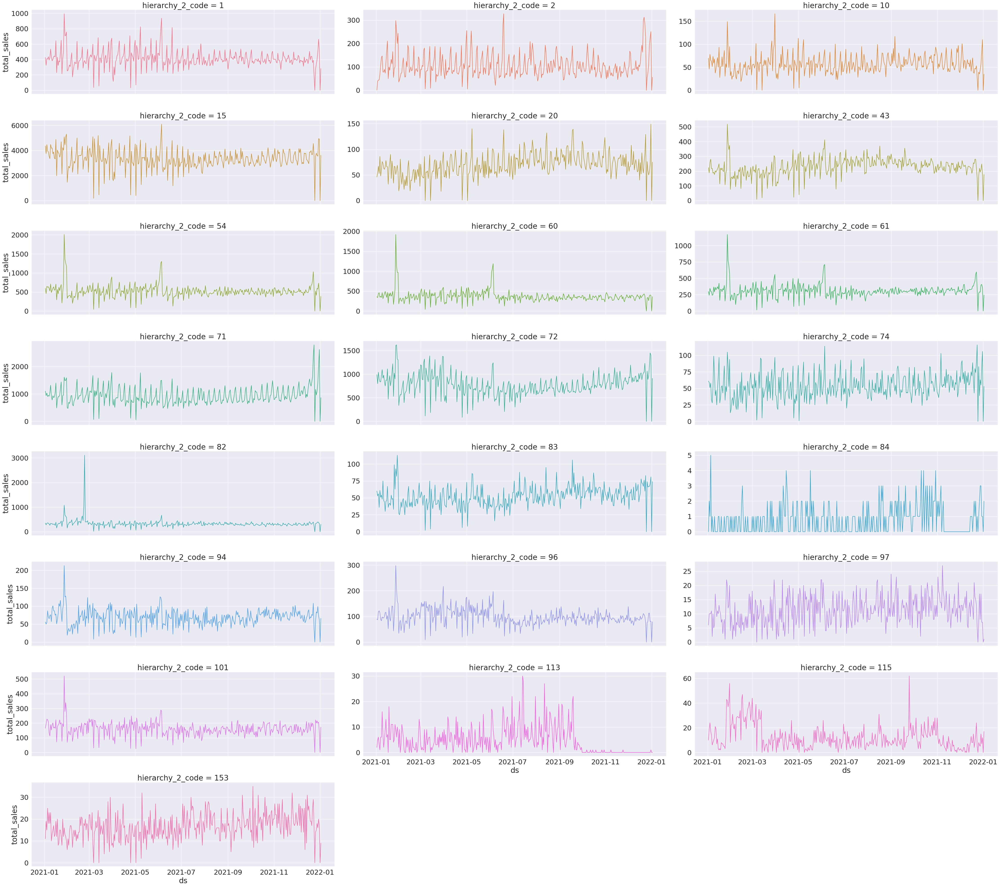

In [38]:
ventas_por_rubro = ventas_por_dia(df_final, 
                                  'hierarchy_2_code', 
                                  3)

Realizaremos un nuevo análisis del rubro 153, el cual habíamos examinado previamente, con el objetivo de identificar las series que fueron excluidas después de aplicar los criterios de exclusión mencionados. Al realizar esta revisión, obtendremos una visión más clara de qué productos en particular se vieron afectados por la exclusión y cómo esto puede influir en nuestras conclusiones y predicciones. Este análisis nos permitirá evaluar si la exclusión de estas series fue apropiada y si es necesario realizar ajustes adicionales en nuestra metodología.

In [39]:
# Seleccionamos el rubro
rubro_seleccionado = 153
# rubro_seleccionado = 82

# Creamos el dataset de ese rubro
df_rubro_final = df_final.loc[df_final.hierarchy_2_code==rubro_seleccionado]
df_rubro_final.nunique()

ds                  366
hierarchy_2_code      1
item_id               5
y                    16
mes                  12
dia                  31
dia_semana_abrev      7
dtype: int64

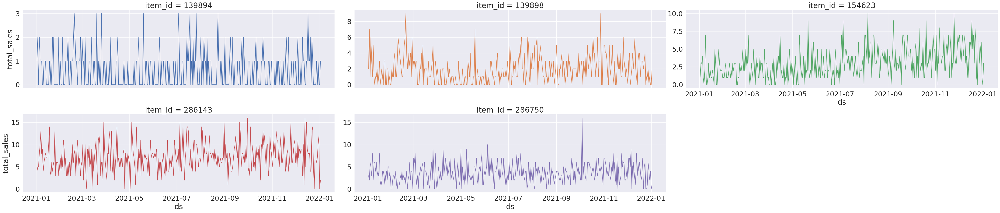

In [40]:
# Seleccionamos los primeros 24 items, en este caso solo tenemos 5
items = df_rubro_final.item_id.unique()[:24]
item_select = items[0:24]

# Utilizamos la función para agrupar y graficar las ventas diarias
ventas_rubro = ventas_por_dia(df_rubro_final.loc[df_rubro_final.item_id.isin(item_select)], 
                              'item_id',
                              3)

En el rubro 153, tras la exclusión de series, nos quedamos únicamente con los 5 primeros items para su análisis. No obstante, al revisar el gráfico anterior, resulta llamativo el cambio en el comportamiento del rubro 113, el cual ha experimentado una disminución en sus ventas durante los últimos meses. Este hallazgo resalta la importancia de realizar un seguimiento detallado de las series restantes y examinar las posibles causas de este descenso en las ventas del rubro 113.

In [41]:
# Seleccionamos el rubro
rubro_seleccionado = 113

ds                  366
hierarchy_2_code      1
item_id             840
y                    37
mes                  12
dia                  31
dia_semana_abrev      7
dtype: int64


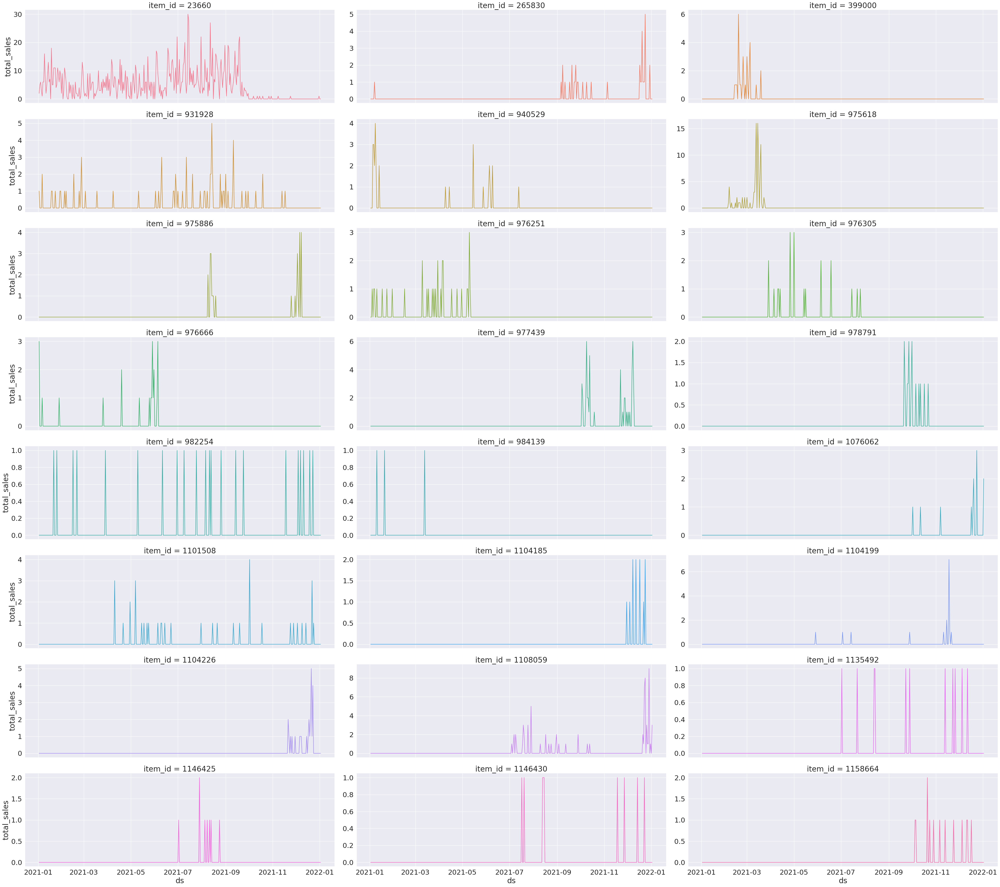

In [42]:
## Creamos el dataset de ese rubro
df_rubro = df_train.loc[df_train.hierarchy_2_code==rubro_seleccionado]
print(df_rubro.nunique())

# Seleccionamos los primeros 24 items
items = df_rubro.item_id.unique()
item_select = items[24:48]

# Utilizamos la función para agrupar y graficar las ventas diarias
ventas_rubro = ventas_por_dia(df_rubro.loc[df_rubro.item_id.isin(item_select)], 
                              'item_id', 
                              3)

ds                  366
hierarchy_2_code      1
item_id               1
y                    24
mes                  12
dia                  31
dia_semana_abrev      7
dtype: int64


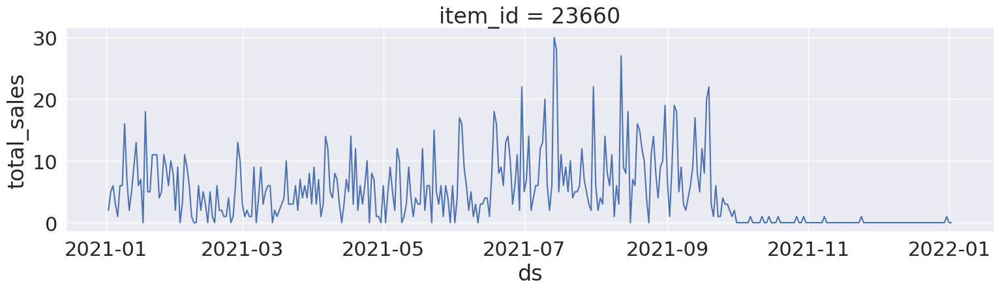

In [43]:
# Creamos el dataset de ese rubro
df_rubro_final = df_final.loc[df_final.hierarchy_2_code==rubro_seleccionado]
print(df_rubro_final.nunique())

# Seleccionamos los primeros 24 items
items = df_rubro_final.item_id.unique()
item_select = items[0:24]

# Utilizamos la función para agrupar y graficar las ventas diarias
ventas_rubro = ventas_por_dia(df_rubro_final.loc[df_rubro_final.item_id.isin(item_select)], 'item_id', 3)

Al examinar el rubro, se observa que solo se conserva un item_id, y en los últimos meses se registra una notable disminución en las ventas de dicho item. Esta situación plantea la posibilidad de enfrentar desafíos al realizar las predicciones, ya que la falta de datos relevantes podría dificultar la estimación precisa. Una alternativa podría ser considerar una ventana de tiempo más reducida, aunque esta opción requeriría un análisis más exhaustivo que consumiría más tiempo. Por el momento, mantendremos el criterio establecido, pero es importante tener en cuenta la necesidad de una evaluación continua y flexible para asegurar la calidad de las predicciones en estas circunstancias.

### Análisis de outliers

Cuando se trata de lidiar con outliers en series de tiempo, existen diversas estrategias disponibles. Una de ellas consiste en excluirlos, mientras que otra opción es imputarles algún valor. En el caso de las series de tiempo, considero que la imputación es la mejor solución, ya que nos permite suavizar la influencia de los outliers sin eliminarlos por completo y evitamos la pérdida de información relevante.

Existen varios métodos para llevar a cabo la imputación. Uno de ellos es la imputación basada en percentiles, donde se sustituyen los valores extremos por un valor que se encuentra dentro de un rango específico. Otro enfoque implica utilizar la desviación estándar, que proporciona una medida de dispersión de los datos. También existen métodos más elaborados, como los modelos de detección de anomalías o modelos estadísticos como el ajuste de un modelo ARIMA y la utilización de los residuos para detectar outliers.

En este caso, utilizaremos el método basado en la desviación estándar. Estableceremos un umbral de 5 desviaciones estándar: si el valor de las ventas se encuentra a más de 5 desviaciones estándar de la media, imputaremos el máximo valor registrado que cumpla esta condición. Esta estrategia nos permitirá corregir los valores extremos y mitigar su impacto en los análisis posteriores. En estudios futuros, podríamos explorar otros métodos para determinar si obtenemos mejores resultados en la detección y corrección de outliers en nuestras series de tiempo. También exploraremos que sucede en aquellos días festivos en los que no se registra ninguna venta.

In [44]:
# Calculamos la media y desviación estándar para cada item_id
df_final_imput = df_final.copy()
grouped = df_final_imput.groupby("item_id")
means = grouped["y"].mean()
stds = grouped["y"].std()

# Obtenemos el máximo valor no outlier para cada item_id
max_non_outlier = grouped["y"].apply(lambda x: x[x <= (x.mean() + 5 * x.std())].max())
df_final_imput["max_non_outlier"] = df_final_imput["item_id"].map(max_non_outlier)

# Imputamos los outliers con el máximo valor no outlier
condition = df_final_imput.loc[df_final_imput.y.notnull(), 'y'] > df_final_imput.loc[df_final_imput.y.notnull(),
                                                                                     'max_non_outlier']
df_final_imput["outlier"] = df_final_imput.loc[df_final_imput.y.notnull(), 'y'] > df_final_imput.loc[df_final_imput.y.notnull(),
                                                                                                     'max_non_outlier']
df_final_imput.loc[df_final_imput.outlier==True, 'y'] = df_final_imput.loc[df_final_imput.outlier==True,
                                                                           'max_non_outlier']

# Eliminamos la columnas auxiliares
df_final_imput.drop(["max_non_outlier","outlier"], axis=1, inplace=True)
df_final_imput.reset_index(drop=True, inplace=True)

Una vez que hemos realizado la imputación de los outliers, procederemos a analizar nuevamente el rubro 153, que originalmente contenía un único item, el 286750, con un valor atípico. Ahora, con los valores corregidos, podremos obtener una visualización más precisa y detallada de las ventas de este rubro.

In [45]:
# Seleccionamos el rubro
rubro_seleccionado = 153

# Creamos el dataset de ese rubro
df_rubro_final = df_final_imput.loc[df_final_imput.hierarchy_2_code==rubro_seleccionado]
df_rubro_final.nunique()

ds                  366
hierarchy_2_code      1
item_id               5
y                    16
mes                  12
dia                  31
dia_semana_abrev      7
dtype: int64

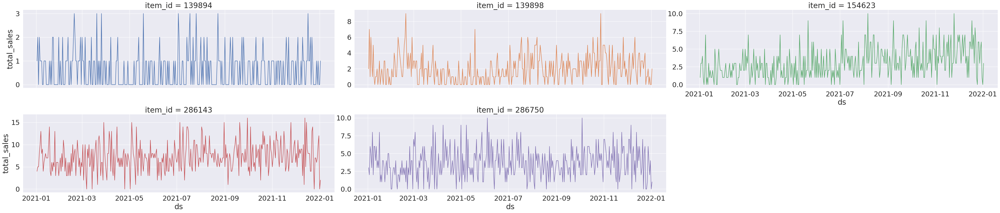

In [46]:
# Seleccionamos los primeros 24 items, en este caso solo tenemos 5
items = df_rubro_final.item_id.unique()[:24]
item_select = items[0:24]

# Utilizamos la función para agrupar y graficar las ventas diarias
ventas_rubro = ventas_por_dia(df_rubro_final.loc[df_rubro_final.item_id.isin(item_select)], 'item_id', 3)

Tras abordar el problema de las series incompletas y los outliers mediante las respectivas exclusiones e imputaciones, se ha logrado obtener un dataset depurado y listo para ser utilizado en el ajuste de los modelos predictivos. Esta limpieza de los datos nos brinda la confianza necesaria para utilizarlos como base sólida en la creación de nuestros modelos, permitiéndonos realizar pronósticos más precisos y confiables sobre las ventas futuras (por lo menos en la mayoría de los items). Guardaremos este dataset depurado para utilizarlo en el ajuste de nuestros modelos.

In [47]:
df_final_imput.head()

,ds,hierarchy_2_code,item_id,y,mes,dia,dia_semana_abrev
0,2021-01-02,82,1088128,NaN,1,2,Sat
1,2021-01-02,10,190535,8.43,1,2,Sat
2,2021-01-02,94,161581,2.00,1,2,Sat
3,2021-01-02,43,2025,3.00,1,2,Sat
4,2021-01-02,15,2095,0.42,1,2,Sat


In [50]:
df_final_imput[['ds', 'hierarchy_2_code', 'item_id', 'y']].to_csv('datos_ventas_train_cleaned.csv',
                      index=False)